In [1]:
import numpy as np

%matplotlib ipympl
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from astropy.time import Time
from astroquery.jplhorizons import Horizons
import datetime

codes = {'Io': 501, 'Europa': 502, 'Ganymede': 503, 'Callisto': 504, 'Jupiter': 599}

matplotlib.rcParams.update({'font.size': 22})

In [2]:
def dt_to_jd(dt):
    return dt.toordinal() + 1721424.5

In [3]:
start_time = Time(['2023-11-08']).jd
end_time = Time(['2023-11-27']).jd

In [4]:
FRAME_ = 60*60 # seconds

In [5]:
from scipy import optimize

class Satellite:              
    def __init__(self, name, code, start_time):
        '''time in jd'''
        self.start_time = start_time
        
        data = Horizons(id=code, id_type='majorbody', location=599, epochs=self.start_time).elements()
        a = data['a'][0] / .008  # in AU
        T = data['P'][0] * 24 * 60 * 60 
        ecc = data['e'][0]
        
        print(a, T, ecc)
        
        self.name = name
        self.T = T              # orbital period in seconds
        self.a = a              # semi major axis in pixels
        self.ecc = ecc          # eccentricity
        self.b = self.a * np.sqrt(1 - self.ecc**2)
        
    def init_plot(self, color='b'):
        # t0 is custom time value 
        # x0, y0 = self.pos(self.start_time)
        x0, y0 = self.pos(self.start_time)
        print(x0, y0)
        self.plot = ax.plot(x0, y0, label=self.name)[0]
    
    def pos(self, time):
        '''
        time in sec
        '''
        def f(E):
            M = 2 * np.pi * time / self.T
            return (E - self.ecc * np.sin(E) - M)
        E = optimize.newton(f, 1.5, maxiter=1000)
        x = self.a * (np.cos(E) - self.ecc)
        y = self.b * np.sin(E)
        return x, y
        
    def update(self, frame):
        xs = []
        ys = []
        for dt in np.linspace(0, frame, 60):
            x, y = self.pos(self.start_time + dt * 60 * 60)
            xs.append(x)
            ys.append(y)

        self.plot.set_xdata(xs[:])
        self.plot.set_ydata(ys[:])
        return self.plot

In [6]:
class System:
    def __init__(self, start_time):
        self.satellites = []
        self.start_time = start_time # initial time?
        self.time = self.start_time
        # self.timestamp = ax.text(.03, .94, 'Date: ', color='w', transform=ax.transAxes, fontsize='x-large')
        
    def add_satellite(self, satellite):
        self.satellites.append(satellite)
        return True
        
    def evolve(self, frame):
        self.time += FRAME_
        
        res = []
        for s in self.satellites:
            res.append(s.update(frame))
        # self.timestamp.set_text('Date: ' + Time(self.time, format='jd', out_subfmt='date'))
        return res

0.35264784746802186 153052.13206623227 0.004764193389014616
[0.31255677] [0.16004725]
0.8947136709283687 618510.2562477364 0.001998358693623597
[0.884133] [-0.12512611]
0.5608015186856746 306934.7251914901 0.009499107265022665
[0.55274172] [0.05529237]
1.5740401266498862 1443275.16048362 0.007477872505076579
[-0.46518993] [-1.5072777]


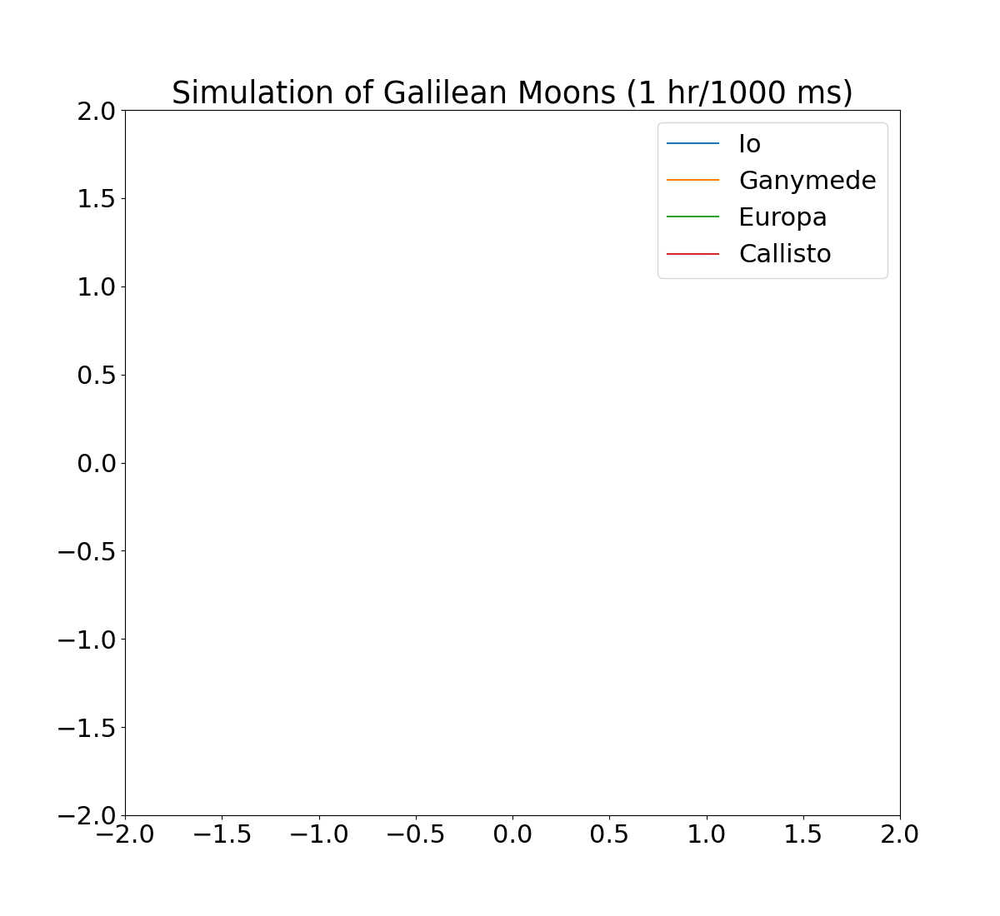

In [7]:
%matplotlib ipympl

fig = plt.figure(figsize=[12, 11])
ax = plt.axes(xlim=[-2, 2], ylim=[-2, 2])

master = System(start_time=start_time)

for s in ['Io', 'Ganymede', 'Europa', 'Callisto']:
    sat = Satellite(name=s, code=codes.get(s), start_time=master.start_time)
    sat.init_plot(master.start_time)
    master.add_satellite(sat)

def animate(frame):
    return master.evolve(frame)

# ani = animation.FuncAnimation(fig=fig, func=animate, frames=int((end_time - start_time)[0]), interval=200, blit=True)
ani = animation.FuncAnimation(fig=fig, func=animate, frames=100, interval=1000, blit=True)
ax.legend()
plt.title('Simulation of Galilean Moons (1 hr/1000 ms)')
plt.show()

In [8]:
ani.save('./animation2.mp4')

In [6]:
# find periapsis time to sync to real-time
obj = Horizons( id=503, id_type='majorbody', location=599, epochs=Time(['2023-11-09']).jd)
obj.elements()['a']
# raw = obj.vectors(get_raw_response=True)
# print(raw)

# f = open('./output.txt', 'w')
# f.write(raw)

0.007155128884142939


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


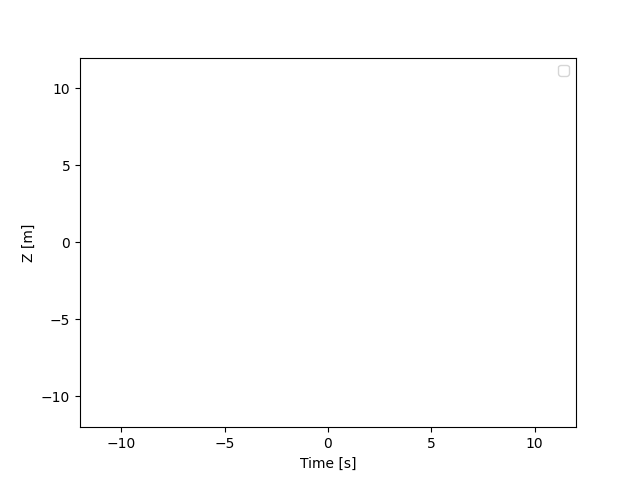

[]
[9.8329]
[9.8329, 9.831367611369204]
[9.8329, 9.831367611369204, 9.826770947036485]
[9.8329, 9.831367611369204, 9.826770947036485, 9.819111511470414]
[9.8329, 9.831367611369204, 9.826770947036485, 9.819111511470414, 9.808391811417366]
[9.8329, 9.831367611369204, 9.826770947036485, 9.819111511470414, 9.808391811417366, 9.794615354850166]
[9.8329, 9.831367611369204, 9.826770947036485, 9.819111511470414, 9.808391811417366, 9.794615354850166, 9.777786649497266]
[9.8329, 9.831367611369204, 9.826770947036485, 9.819111511470414, 9.808391811417366, 9.794615354850166, 9.777786649497266, 9.757911200953513]
[9.8329, 9.831367611369204, 9.826770947036485, 9.819111511470414, 9.808391811417366, 9.794615354850166, 9.777786649497266, 9.757911200953513, 9.734995510373839]
[9.8329, 9.831367611369204, 9.826770947036485, 9.819111511470414, 9.808391811417366, 9.794615354850166, 9.777786649497266, 9.757911200953513, 9.734995510373839, 9.709047071751565]
[9.8329, 9.831367611369204, 9.826770947036485, 9.819

In [6]:
%matplotlib ipympl

fig, ax = plt.subplots()

earth = Satellite('earth', T=365, a=10, ecc=0.01671)

ax.set(xlim=[-12, 12], ylim=[-12, 12], xlabel='Time [s]', ylabel='Z [m]')
ax.legend()

# earth.init_plot()

def update(frame):
    # for each frame, update the data stored on each artist.

    # update the scatter plot:

    return earth.update(frame)


ani = animation.FuncAnimation(fig=fig, func=update, frames=365*2, interval=200, blit=True)
plt.show()

In [5]:
e = 0.01671

def f(E):
    
    t = 2
    T = 365
    M = 2 * np.pi * t/T
    return (E - e*np.sin(E) - M)

from scipy import optimize
root = optimize.newton(f, 1.5)


E = optimize.newton(f, 1.5)

a = 10 # km
b = a * np.sqrt(1 - e**2)

x = a * (np.cos(E) - e)
y = b * np.sin(E)

print(x,y)

9.826770947036485 0.35001325243946774


In [8]:
ani.save('./animation.mp4')

In [34]:
e = 0.01671

def f(E):
    
    t = 2
    T = 365
    M = 2 * np.pi * t/T
    return (E - e*np.sin(E) - M)

from scipy import optimize
root = optimize.newton(f, 1.5)


E = optimize.newton(f, 1.5)

a = 10 # km
b = a * np.sqrt(1 - e**2)

x = a * (np.cos(E) - e)
y = b * np.sin(E)